# V1 : test data include only 2021

In [42]:
from PIL import Image
import numpy as np
import pandas as pd
import scipy
pd.options.mode.chained_assignment = None  # default='warn'

import os, glob, cv2, itertools, random, math

from sklearn.model_selection import train_test_split
from matplotlib import pyplot as plt
from sklearn.metrics import r2_score, mean_squared_error

from skimage.measure import block_reduce

from numpy.random import seed
from sklearn.preprocessing import StandardScaler
from time import time

from sklearn.metrics import accuracy_score

import keras
from tensorflow.keras import optimizers,losses,metrics
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.applications.xception import Xception
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.vgg19 import VGG19
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.applications.mobilenet import MobileNet
from tensorflow.keras.applications.densenet import DenseNet121
from tensorflow.keras.applications.densenet import DenseNet169


from tensorflow.keras import initializers

from tensorflow.keras.utils import plot_model
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.layers import Input, Dense, Flatten, LSTM, Dropout,SimpleRNN, GlobalAveragePooling2D, GlobalMaxPooling2D, BatchNormalization
from keras.layers.convolutional import Conv2D
from keras.layers.pooling import MaxPooling2D
from tensorflow.keras.layers.experimental.preprocessing import Normalization
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, TerminateOnNaN, ModelCheckpoint
print("Success")

Success


# Input settings

In [43]:
########## input settings ###########

### select season of images ###

season = 1

#date1 is for test and val and  train, date2 is for train and val
date1 = "img_2021season{}".format(season)
date2=[["img_20190419","img_20200415"],["img_20190503","img_20200429"],["img_20190513","img_20200515"],["img_20190522","img_20200530"]]
date2 = date2[season-1]

img_size = 100
dim = (img_size,img_size)

### select band ###

color = ["green","red","nir"]

path_input = r"C:\Users\crop science\env\ImageRegression_wheat\img"
path_yield2019 = "data_2019.csv"
path_yield2020 = "data_2020.csv"
path_yield2021 = "data_2021.csv"

### remove NA ###

#2021 date include NA ,  id = 16 & 31 & 93   * index = 15, 30, 92      * morishita id  = 301 (no images at morishita in season3 $ season4) index = 300
rm_2021 = [15,30,92]

# Load data (include test)    *2021

In [44]:
### Get sample numbers of each year ###      * When mix multi season in same season

img_num1= len(glob.glob(path_input+"\\"+date1+"\\"+color[0]+"*-0.tif"))
index_2021_all = list(range(img_num1+1))
img_num1 -= 3

# not > and > or
# for remove invalid data
index_2021 = [x for x in index_2021_all if not (x==15 or x==30 or x==92 or x==300)]

### Open images ###

X = np.zeros([img_num1,img_size,img_size,len(color)])

for k in range(len(color)):
    x=0
    files =[]
    data= glob.glob(path_input +"\\"+date1 + "\\" + color[k] + "*-0.tif")
    data.sort()
    files.extend(data) 
    for f in range(len(files)):
        img = Image.open(files[f])
        imarray = np.array(img)
        resized = cv2.resize(imarray, dim, interpolation = cv2.INTER_NEAREST)
        if f==15 or f==30 or f==92 :
            pass                
        else:
            X[x,:,:,k] = resized
            x += 1

### Open Yield Table ###

data2021 = pd.read_csv(path_yield2021)
Y2021 = np.array(data2021['yield'][index_2021])

Y = np.reshape(Y2021,(img_num1,1))

print(Y.shape)
            
### for open image slided ###
id_all = list(range(img_num1))
point_id = []
date_id = []
for i in index_2021:
    point_id.append(str(i+1).zfill(3))
    date_id.append(date1)

(309, 1)


# Load data  (only for train & validation)    *2019&2020

In [45]:
### Get sample numbers of each year ###      * When mix multi season in same season

num_each_year = []
img_num2 = 0

for i in range(len(date2)):
    per_year= len(glob.glob(path_input+"\\"+date2[i]+"\\"+color[0]+"*-0.tif"))
    num_each_year.append(per_year)
    img_num2 += per_year

    
### Open images ###
    
X2 = np.zeros([img_num2,img_size,img_size,len(color)])

for k in range(len(color)):
    x=0
    for i in range(len(date2)):
        files =[]
        data= glob.glob(path_input +"\\"+date2[i] + "\\" + color[k] + "*-0.tif")
        data.sort()
        files.extend(data) 
        for f in range(len(files)):
            img = Image.open(files[f])
            imarray = np.array(img)
            resized = cv2.resize(imarray, dim, interpolation = cv2.INTER_NEAREST)
            X2[x,:,:,k] = resized
            x += 1

print(X2.shape)


### Open Yield Table ###
data2019 = pd.read_csv(path_yield2019)
Y2019 = np.array(data2019['yield'])

data2020 = pd.read_csv(path_yield2020)
Y2020 = np.array(data2020['yield'])

Y2 = np.concatenate([Y2019,Y2020])

Y2 = np.reshape(Y2,(img_num2,1))

print(Y2.shape)
            
### for open image slided ###
id2_all = list(range(img_num2))
point2_id = []
date2_id = []
for x in range(len(num_each_year)):
    for i in range(num_each_year[x]):
        point2_id.append(str(i+1).zfill(3))
        date2_id.append(date2[x])

(242, 100, 100, 3)
(242, 1)


# Split Training & Validation & Test Dataset  64:16:20

In [46]:
# 64:16:20 (splitratio1,2,3 = 0.575, 0.2, 0,2)
# a=1540
# b=1573
# c=939

# 60:20:20
a = 1540
b = 789
c = 889


X_low = np.concatenate([X[0:98],X[201:294]])
X_mid = np.concatenate([X[98:201],X[294:]])
Y_low = np.concatenate([Y[0:98],Y[201:294]])
Y_mid = np.concatenate([Y[98:201],Y[294:]])
id_low = id_all[0:98] + id_all[201:294]
id_mid = id_all[98:201] + id_all[294:]

X_low_train, X_test, Y_low_train, Y_test, id_low_train, id_test = train_test_split(X_low, Y_low, id_low, test_size=0.575, shuffle=True, random_state=a)

X_train = np.concatenate([X_low_train,X_mid])
Y_train = np.concatenate([Y_low_train,Y_mid])
id_train = id_low_train + id_mid


X_train, X_val, Y_train, Y_val, id_train, id_val = train_test_split(X_train, Y_train, id_train, test_size=0.25, shuffle=True, random_state=b)
X2_train, X2_val, Y2_train, Y2_val, id2_train, id2_val = train_test_split(X2, Y2, id2_all, test_size=0.25, shuffle=True, random_state=c)

print("X_train:" +str(X_train.shape))
print("X_val:" +str(X_val.shape))
print("X_test:" +str(X_test.shape))
print("Y_train:" +str(Y_train.shape))
print("Y_val:" +str(Y_val.shape))
print("Y_test:" +str(Y_test.shape))
print("id_train:" +str(len(id_train)))
print("id_val:" +str(len(id_val)))

print("X2_train:" +str(X2_train.shape))
print("X2_val:" +str(X2_val.shape))
print("Y2_train:" +str(Y2_train.shape))
print("Y2_val:" +str(Y2_val.shape))
print("id2_train:" +str(len(id2_train)))
print("id2_val:" +str(len(id2_val)))

print("train_total:" + str(len(id_train)+(len(id2_train))))
print("val_total:" + str(len(id_val)+(len(id2_val))))
print("test_total:" +str(len(id_test)))

X_train:(149, 100, 100, 3)
X_val:(50, 100, 100, 3)
X_test:(110, 100, 100, 3)
Y_train:(149, 1)
Y_val:(50, 1)
Y_test:(110, 1)
id_train:149
id_val:50
X2_train:(181, 100, 100, 3)
X2_val:(61, 100, 100, 3)
Y2_train:(181, 1)
Y2_val:(61, 1)
id2_train:181
id2_val:61
train_total:330
val_total:111
test_total:110


# Buffer Extraction

In [47]:
### for date1 ###
X_aug = np.zeros([len(X_train)*9,img_size,img_size,len(color)])

for k in range(0,len(color)):
    x=0
    for slide in range(0,9):
        for i in id_train:
            img_path = path_input + "\\" + date_id[i] + "\\" + color[k] + "_" + date_id[i][4:] + "_" + point_id[i] + "-" + str(slide) + ".tif"
            img = Image.open(img_path)
            imarray = np.array(img)
            resized = cv2.resize(imarray, dim, interpolation = cv2.INTER_NEAREST)
            X_aug[x,:,:,k] = resized
            x = x + 1

X_train = X_aug
Y_train = np.concatenate([Y_train,Y_train,Y_train,Y_train,Y_train,Y_train,Y_train,Y_train,Y_train])


### for date2 ###

X2_aug = np.zeros([len(X2_train)*9,img_size,img_size,len(color)])

for k in range(0,len(color)):
    x=0
    for slide in range(0,9):
        for i in id2_train:
            img_path = path_input + "\\" + date2_id[i] + "\\" + color[k] + "_" + date2_id[i][4:] + "_" + point2_id[i] + "-" + str(slide) + ".tif"
            img = Image.open(img_path)
            imarray = np.array(img)
            resized = cv2.resize(imarray, dim, interpolation = cv2.INTER_NEAREST)
            X2_aug[x,:,:,k] = resized
            x = x + 1

X2_train = X2_aug
Y2_train = np.concatenate([Y2_train,Y2_train,Y2_train,Y2_train,Y2_train,Y2_train,Y2_train,Y2_train,Y2_train])


### concatenate date1 & date2 ###

X_train = np.concatenate([X_train, X2_train])
Y_train = np.concatenate([Y_train, Y2_train])

X_val = np.concatenate([X_val, X2_val])
Y_val = np.concatenate([Y_val, Y2_val])

In [48]:
### Check Augmented shape ###

print(X_train.shape)
print(X_val.shape)
print(X_test.shape)

print(Y_train.shape)
print(Y_val.shape)
print(Y_test.shape)

(2970, 100, 100, 3)
(111, 100, 100, 3)
(110, 100, 100, 3)
(2970, 1)
(111, 1)
(110, 1)


# Check input image

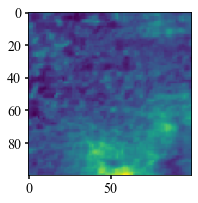

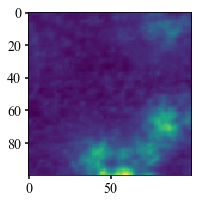

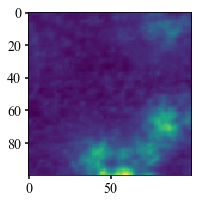

In [49]:
# first image for green
plt.imshow(X_test[0,:,:,0])#, interpolation='nearest')
plt.show()

# first image for red
plt.imshow(X_test[0,:,:,1])#, interpolation='nearest')
plt.show()

# first image for nir
plt.imshow(X_test[0,:,:,1])#, interpolation='nearest')
plt.show()

# Main Architecture

In [50]:
def CNN_model(img_size,channel):

    input1 = Input(shape=(img_size, img_size,channel))
    x = Feature_extractor(input1)
    x = GlobalAveragePooling2D()(x)
    output1 = Dense(1)(x)
    model = Model(inputs=input1, outputs=output1)
    model.compile(loss="mean_absolute_error", 
                  optimizer=optimizers.Adam(learning_rate=learning_rate),
                  metrics=['mean_absolute_error'])
    model.summary()
    return model

## Select  Feature Extractor

In [55]:
architecture = 'AlexNet'
def Feature_extractor(x):   
    x = Conv2D(filters=96, kernel_size=3, strides=(1, 1), padding='same', activation='relu', bias_initializer='zeros')(x) 
    x = MaxPooling2D(pool_size=(2, 2))(x) 
    x = BatchNormalization()(x) 
    x = Conv2D(filters=256, kernel_size=3, strides=(1,1), padding='same', activation='relu', bias_initializer='ones')(x) 
    x = MaxPooling2D(pool_size=(2, 2))(x) 
    x = BatchNormalization()(x) 
    x = Conv2D(filters=384, kernel_size=3, strides=(1,1), padding='same', activation='relu', bias_initializer='zeros')(x) 
    x = Conv2D(filters=384, kernel_size=3, strides=(1,1), padding='same', activation='relu', bias_initializer='ones')(x) 
    x = Conv2D(filters=256, kernel_size=3, strides=(1,1), padding='same', activation='relu', bias_initializer='ones')(x) 
    x = MaxPooling2D(pool_size=(2, 2))(x) 
    x = BatchNormalization()(x) 
    return x

In [63]:
architecture = 'VGG16'
def Feature_extractor(x):
    x = VGG16(include_top=False, weights=None , input_shape=(img_size, img_size, len(color)))(x)
    return x

In [67]:
architecture = 'VGG19'
def Feature_extractor(x):
    x = VGG19(include_top=False, weights=None , input_shape=(img_size, img_size, len(color)))(x)
    return x

In [29]:
architecture = 'ResNet50'
def Feature_extractor(x):
    x = ResNet50(include_top=False, weights=None , input_shape=(img_size, img_size, len(color)))(x)
    return x

In [51]:
architecture = 'CNN_2conv'
def Feature_extractor(x):   
    x = Conv2D(filters=64, kernel_size=3, strides=(1, 1), padding='same', activation='relu')(x) 
    x = MaxPooling2D(pool_size=(2, 2))(x) 
    x = BatchNormalization()(x) 
    x = Conv2D(filters=256, kernel_size=3, strides=(1,1), padding='same', activation='relu')(x) 
    x = MaxPooling2D(pool_size=(2, 2))(x) 
    x = BatchNormalization()(x) 
    return x

# Visualize model architecture

In [28]:
plot_model(model, to_file='./architecture/keras/' + architecture + '.png')

ResNet152


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.783206 to fit


'./architecture\\ResNet152.png'

# Training process

In [68]:
################
### Seetings ###
################

import datetime
dt_now = datetime.datetime.now()

PATIENCE = 15 # Generally, 10-20
EPOCH = 50
BATCH_SIZE = 16
learning_rate = 0.001
output_name = "Keras_{}_season{}_{}band_{}".format(architecture, season, len(color), dt_now.strftime('%Y-%m-%d_%Hh%Mm%Ss'))
print(output_name)
filepath = './model/' + output_name

Keras_VGG19_season1_3band_2021-10-25_14h40m19s


In [69]:
#################
# Train process #
#################

### callbacks ###
es_cb = EarlyStopping(monitor='val_loss',patience=PATIENCE,verbose=1,mode='auto')
rp_cb = ReduceLROnPlateau(monitor='val_loss', factor=0.3, patience=2, verbose=0, mode='auto', min_delta=0.0001, cooldown=0, min_lr=0)
tn_cb = TerminateOnNaN()
cp_cb = ModelCheckpoint(filepath, monitor='val_loss', verbose=0, save_best_only=True, save_weights_only=False, mode='auto')

### training ###

model=CNN_model(img_size=img_size,channel=len(color))
epoch = EPOCH
batch_size =BATCH_SIZE
history = model.fit(
    x=X_train,
    y=Y_train, 
    batch_size= batch_size,
    epochs=epoch, 
    validation_data=(X_val,Y_val), 
    shuffle=True,
    callbacks=[es_cb,rp_cb,tn_cb,cp_cb]
)

Model: "model_17"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_20 (InputLayer)        [(None, 100, 100, 3)]     0         
_________________________________________________________________
vgg19 (Functional)           (None, 3, 3, 512)         20024384  
_________________________________________________________________
global_average_pooling2d_17  (None, 512)               0         
_________________________________________________________________
dense_17 (Dense)             (None, 1)                 513       
Total params: 20,024,897
Trainable params: 20,024,897
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
186/186 [==============================] - 7s 32ms/step - loss: 257.4964 - mean_absolute_error: 257.4964 - val_loss: 136.6877 - val_mean_absolute_error: 136.6877- loss: 337.38
INFO:tensorflow:Assets written to: ./model\Keras_VGG19_se

# Check the model

Yield calibration RMSE: 97
Yield calibration RMSPE: 0.23
Yield calibration R2: 0.561
Yield validation RMSE: 97
Yield validation RMSPE: 0.21
Yield validation R2: 0.584
Yield test RMSE: 79
Yield test RMSPE: 0.27
Yield test R2: 0.700


C:\Users\CROPSC~1\AppData\Local\Temp/ipykernel_10992/3778575012.py:22: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k-" (-> color='k'). The keyword argument will take precedence.
  ax.plot((min(Y), max(Y)),(min(Y), max(Y)), 'k-', alpha=0.7, zorder=1, color='r', lw=1.5)


<AxesSubplot:xlabel='Observed', ylabel='Predicted'>

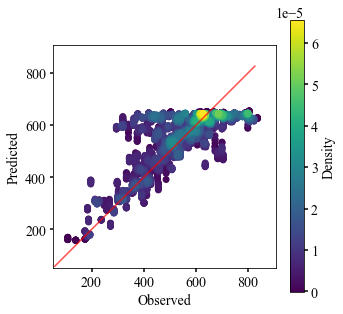

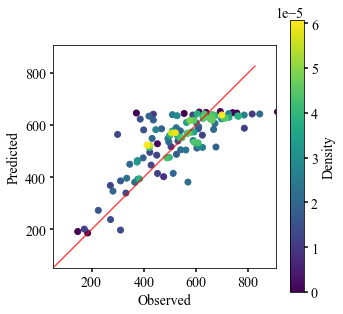

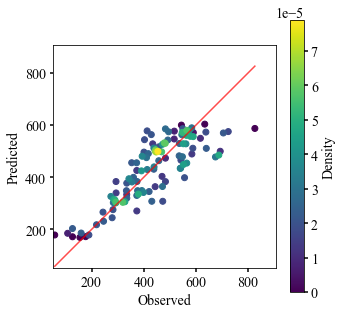

In [70]:
from matplotlib import cm
from matplotlib.colors import Normalize 
from scipy.interpolate import interpn

def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    x2 = x.flatten()
    y2 = y.flatten()
    if ax is None :
        fig, ax = plt.subplots(figsize=(5,5))
    data , x_e, y_e = np.histogram2d( x2, y2, bins = bins, density = True )
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x2,y2]).T , method = "splinef2d", bounds_error = False)

    #To be sure to plot all data
    z[np.where(np.isnan(z))] = 0.0

    # Sort the points by density, so that the densest points are plotted last
    if sort :
        idx = z.argsort()
        x2, y2, z = x2[idx], y2[idx], z[idx]

    ax.scatter(x2, y2, c=z, **kwargs )
    ax.plot((min(Y), max(Y)),(min(Y), max(Y)), 'k-', alpha=0.7, zorder=1, color='r', lw=1.5)
    ax.set_aspect('equal')
    ax.set_xlim([0.9*min(Y),1.1*max(Y)])
    ax.set_ylim([0.9*min(Y),1.1*max(Y)])
    ax.set_xlabel('Observed')
    ax.set_ylabel('Predicted')
    
    #colorbar
    norm = Normalize(vmin = np.min(z), vmax = np.max(z))
    cbar = fig.colorbar(cm.ScalarMappable(norm = norm), ax=ax)
    cbar.ax.set_ylabel('Density')

    return ax

# Predict with the best model.
model = load_model(filepath)

pred_train = model.predict(X_train)
pred_val = model.predict(X_val)
pred_test = model.predict(X_test)

print("Yield calibration RMSE: %.0f" % (np.sqrt(mean_squared_error(Y_train, pred_train))))
print("Yield calibration RMSPE: %.2f" % (np.sqrt(np.mean(np.square(((Y_train - pred_train)/ Y_train)), axis=0))))
print("Yield calibration R2: %.3f" % (r2_score(Y_train, pred_train)))

print("Yield validation RMSE: %.0f" % (np.sqrt(mean_squared_error(Y_val, pred_val))))
print("Yield validation RMSPE: %.2f" % (np.sqrt(np.mean(np.square(((Y_val - pred_val)/ Y_val)), axis=0))))
print("Yield validation R2: %.3f" % (r2_score(Y_val, pred_val)))

print("Yield test RMSE: %.0f" % (np.sqrt(mean_squared_error(Y_test, pred_test))))
print("Yield test RMSPE: %.2f" % (np.sqrt(np.mean(np.square(((Y_test - pred_test)/ Y_test)), axis=0))))
print("Yield test R2: %.3f" % (r2_score(Y_test, pred_test)))

density_scatter(Y_train, pred_train, bins = [30,30] )
density_scatter(Y_val, pred_val, bins = [30,30] )
density_scatter(Y_test, pred_test, bins = [30,30] )

# Graph for the paper

In [62]:
from matplotlib import mathtext
mathtext.FontConstantsBase = mathtext.ComputerModernFontConstants

model=CNN_model(img_size=img_size,channel=len(color))

dir_model =  "Keras_AlexNet_season1_3band_2021-10-25_13h22m29s"

model = load_model('./model/' + dir_model)

# file_weight = "Keras_CNN_2conv_season1_3band_2021-10-22_20h32m46s"
# model.load_weights('./model/' + file_weight)

pred_train = model.predict(X_train)
pred_val = model.predict(X_val)
pred_test = model.predict(X_test)

plt.rcParams.update({'mathtext.default': 'default',
                     'mathtext.fontset': 'stix',
                     'font.family': 'Times New Roman',
                     'font.size': 14,
                     'figure.figsize': (7, 3),
                     'xtick.major.width': 1.5, #主目盛り線の線幅
                     'ytick.major.width': 1.5})


fig = plt.figure()
fig.subplots_adjust(wspace=0.4, hspace=0.1)

ax1 = fig.add_subplot(1, 2, 1)
ax1.scatter(0.01*Y_train, 0.01*np.array(pred_train), alpha=0.02, color='mediumblue') 
ax1.set_title('Train')
ax1.set_xlabel('Observed yield (t $ha^{-1})$') 
ax1.set_ylabel('Predicted yield (t $ha^{-1})$')
x = np.arange(0, 10, 0.1)
y = x
ax1.plot(x, y,"-", color='black') 
ax1.text(1,8,"RMSE: %.2f" % (0.01*np.sqrt(mean_squared_error(Y_train, pred_train))))
ax1.text(1,7,"$r^2$: %.2f" % r2_score(Y_train, pred_train))
ax1.set_xticks([0.0, 2.5, 5.0, 7.5, 10.0])
ax1.set_yticks([0.0, 2.5, 5.0, 7.5, 10.0])
ax1.grid()

ax2 = fig.add_subplot(1, 2, 2)
ax2.scatter(0.01*Y_test, 0.01*np.array(pred_test), alpha=0.3, color='mediumblue') 
ax2.set_title('Test')
ax2.set_xlabel('Observed yield (t $ha^{-1})$') 
ax2.set_ylabel('Predicted yield (t $ha^{-1})$')
x = np.arange(0, 10, 0.1)
y = x
ax2.plot(x, y,"-", color='black')
ax2.text(1,8,"RMSE: %.2f" % (0.01*np.sqrt(mean_squared_error(Y_test, pred_test))))
ax2.text(1,7,"$r^2$: %.2f" % r2_score(Y_test, pred_test))
ax2.set_xticks([0.0, 2.5, 5.0, 7.5, 10.0])
ax2.set_yticks([0.0, 2.5, 5.0, 7.5, 10.0])
ax2.grid()
fig.show()

Model: "model_15"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_17 (InputLayer)        [(None, 100, 100, 3)]     0         
_________________________________________________________________
conv2d_46 (Conv2D)           (None, 100, 100, 96)      2688      
_________________________________________________________________
max_pooling2d_34 (MaxPooling (None, 50, 50, 96)        0         
_________________________________________________________________
batch_normalization_34 (Batc (None, 50, 50, 96)        384       
_________________________________________________________________
conv2d_47 (Conv2D)           (None, 50, 50, 256)       221440    
_________________________________________________________________
max_pooling2d_35 (MaxPooling (None, 25, 25, 256)       0         
_________________________________________________________________
batch_normalization_35 (Batc (None, 25, 25, 256)       102

OSError: SavedModel file does not exist at: ./model/Keras_AlexNet_season1_3band_2021-10-25_13h22m29s\{saved_model.pbtxt|saved_model.pb}

# Get corrrelation between predicted & observed

In [14]:
filename =  "VGG16_season1_8band_2021-09-21_16h46m37s"

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print("cuda available ") if torch.cuda.is_available() == True else print("cuda not available")
model.to(device)

modelpath = './model/main analysis/' + filename + '.pth'
model.load_state_dict(torch.load(modelpath))
model.cuda()
model.eval()



pred_test = batch_pred(X_test)

XX = list(itertools.chain.from_iterable(Y_test)) /100

YY = pred_test / 100


print("Test")
plt.figure(figsize=(5,5))
plt.scatter(XX, YY, alpha=0.5) 
plt.xlabel('Observed') 
plt.ylabel('Predicted')
x = np.arange(0.9*min(XX).item(), 1.1*max(XX).item(), 0.1)
y = x
plt.plot(x, y,"r-")

a, b = np.polyfit(XX, YY, 1)
y2 = a * XX + b
plt.plot(XX, y2,color='black')
print('y='+ str(round(a[0],4)) +'x+'+str(round(b[0],4)))
print("R2:{}".format(r2_score(XX, y2)))

plt.grid()
plt.show()

cuda available 


RuntimeError: Error(s) in loading state_dict for AlexNet:
	Missing key(s) in state_dict: "features.0.bias", "features.3.weight", "features.3.bias", "features.6.weight", "features.6.bias", "features.8.weight", "features.8.bias", "classifier.1.weight", "classifier.1.bias", "classifier.4.weight", "classifier.4.bias". 
	Unexpected key(s) in state_dict: "features.14.weight", "features.14.bias", "features.17.weight", "features.17.bias", "features.19.weight", "features.19.bias", "features.21.weight", "features.21.bias", "features.24.weight", "features.24.bias", "features.26.weight", "features.26.bias", "features.28.weight", "features.28.bias", "features.2.weight", "features.2.bias", "features.5.weight", "features.5.bias", "features.7.weight", "features.7.bias", "features.12.weight", "features.12.bias", "classifier.0.weight", "classifier.0.bias", "classifier.3.weight", "classifier.3.bias". 
	size mismatch for features.0.weight: copying a param with shape torch.Size([64, 8, 3, 3]) from checkpoint, the shape in current model is torch.Size([64, 8, 7, 7]).
	size mismatch for features.10.weight: copying a param with shape torch.Size([256, 128, 3, 3]) from checkpoint, the shape in current model is torch.Size([256, 256, 3, 3]).

# Saliency map

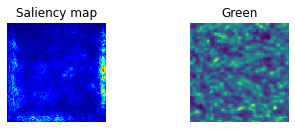

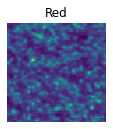

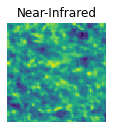

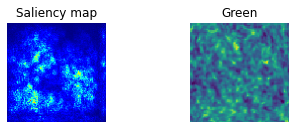

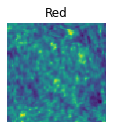

...

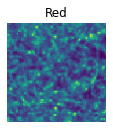

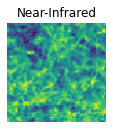

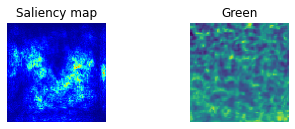

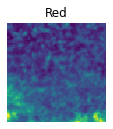

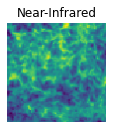

In [16]:
filename =  "VGG16_season1_8band_2021-09-21_16h46m37s"

modelpath = './model/main analysis/' + filename + '.pth'
model.load_state_dict(torch.load(modelpath))
model.cuda()
model.eval()

def saliency(img_index):
    test_image = X_test[img_index].cuda().unsqueeze(0)

    test_image.requires_grad_()

    scores = model(test_image)

    score_max_index = scores.argmax()
    score_max = scores[0,score_max_index]
    score_max.backward()

    saliency, _ = torch.max(test_image.grad.data.abs(),dim=1)

    # code to plot the saliency map as a heatmap
    plt.subplot(1,4,1)
    plt.title("Saliency map")
    plt.imshow(saliency[0].cpu(), cmap=plt.cm.jet)
    plt.axis('off')

    plt.subplot(1,4,2)
    plt.title("Green")
    plt.imshow(test_image.squeeze(0).permute(1,2,0).cpu().detach()[:,:,0])
    plt.axis('off')
    plt.show()
    
    plt.subplot(1,4,3)
    plt.title("Red")
    plt.imshow(test_image.squeeze(0).permute(1,2,0).cpu().detach()[:,:,1])
    plt.axis('off')
    plt.show()
    
    plt.subplot(1,4,4)
    plt.title("Near-Infrared")
    plt.imshow(test_image.squeeze(0).permute(1,2,0).cpu().detach()[:,:,2])
    plt.axis('off')
    plt.show()
    
for i in range(len(X_test)):
    saliency(i)

# Grad - CAM for CNN visualization

In [326]:
# # Grad-CAM
# from gradcam.utils import visualize_cam
# from gradcam import GradCAM, GradCAMpp

filename =  "VGG16_season1_8band_2021-09-21_16h46m37s"

modelpath = './model/main analysis/' + filename + '.pth'
model.load_state_dict(torch.load(modelpath))
model.cuda()
model.eval()

test_image1_tensor = X_test[0].cuda().unsqueeze(0)

feature_extractor = model.features.eval()
avgpool = model.avgpool.eval()
classifier = model.classifier.eval()

# 特徴マップを抽出する
feature = feature_extractor(test_image1_tensor.view(-1,8,100,100))
feature = avgpool(feature)
feature = feature.clone().detach().requires_grad_(True)

# 特徴マップをVGG19の残りの全結合層に通して、予測結果を得る
y_pred = classifier(feature.view(-1,512*7*7))
y_pred[0][torch.argmax(y_pred)].backward()

# 512本のそれぞれのベクトルの要素の平均を取る
alpha = torch.mean(feature.grad.view(512, 7*7), axis=1) # alpha.size() = (512)
feature = feature.view(512,7,7)

# batch_sizeの次元を削除
# (1x512x3x3) -> (512x3x3)
feature = feature.squeeze(0)

In [327]:
def toHeatmap(x):
    x = (x*255).reshape(-1)
    cm = plt.get_cmap('jet')
    x = np.array([cm(int(np.round(xi)))[:3] for xi in x])
    return x.reshape(100,100,3)

(100, 100)


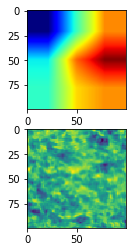

In [328]:
# 論文のLを計算
L = F.relu(torch.sum(feature*alpha.view(-1,1,1),0))
L = L.detach().cpu().numpy()
# L.size() = (3x3)

# 0-1で正規化
L_min = np.min(L)
L_max = np.max(L - L_min)
L = (L - L_min)/L_max

# 元画像と同じサイズにリサイズする
L = cv2.resize(L, (100, 100))
print(L.shape)
# heat map に変換

img2 = toHeatmap(L)
img1 = test_image1_tensor.squeeze(0).permute(1,2,0).cpu()[:,:,3]

# plt.imshow(grad_cam_image.cpu())
plt.subplot(2,1,1)
plt.imshow(img2)
plt.subplot(2,1,2)
plt.imshow(img1.cpu())